In [1]:
%cd diffusion-augmented-pixelsplat/controlnet/

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/controlnet


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# !accelerate launch train_controlnet.py \
#  --pretrained_model_name_or_path="stabilityai/stable-diffusion-2-1-base" \
#  --output_dir="diffusion_model_out" \
#  --dataset_name="Wouter01/re10ksmalltrainn" \
#  --conditioning_image_column=conditioning_image \
#  --image_column=ground_truth_image \
#  --caption_column=prompt \
#  --resolution=256 \
#  --learning_rate=1e-3 \
#  --validation_image "./incorrect_img1.jpeg" "./incorrect_img1.jpeg" \
#  --validation_prompt "" \
#  --train_batch_size=4 \
#  --num_train_epochs=1500 \
#  --tracker_project_name="controlnet" \
#  --enable_xformers_memory_efficient_attention \
#  --checkpointing_steps=100 \
#  --validation_steps=1 \
#  --report_to wandb \
#  --push_to_hub

In [4]:
# Documentation:        
        # Args:
        #     prompt (`str` or `List[str]`, *optional*):
        #         The prompt or prompts to guide image generation. If not defined, you need to pass `prompt_embeds`.
        #     image (`torch.FloatTensor`, `PIL.Image.Image`, `np.ndarray`, `List[torch.FloatTensor]`, `List[PIL.Image.Image]`, `List[np.ndarray]`,:
        #             `List[List[torch.FloatTensor]]`, `List[List[np.ndarray]]` or `List[List[PIL.Image.Image]]`):
        #         The ControlNet input condition to provide guidance to the `unet` for generation. If the type is
        #         specified as `torch.FloatTensor`, it is passed to ControlNet as is. `PIL.Image.Image` can also be
        #         accepted as an image. The dimensions of the output image defaults to `image`'s dimensions. If height
        #         and/or width are passed, `image` is resized accordingly. If multiple ControlNets are specified in
        #         `init`, images must be passed as a list such that each element of the list can be correctly batched for
        #         input to a single ControlNet. When `prompt` is a list, and if a list of images is passed for a single
        #         ControlNet, each will be paired with each prompt in the `prompt` list. This also applies to multiple
        #         ControlNets, where a list of image lists can be passed to batch for each prompt and each ControlNet.
        #     height (`int`, *optional*, defaults to `self.unet.config.sample_size * self.vae_scale_factor`):
        #         The height in pixels of the generated image.
        #     width (`int`, *optional*, defaults to `self.unet.config.sample_size * self.vae_scale_factor`):
        #         The width in pixels of the generated image.
        #     num_inference_steps (`int`, *optional*, defaults to 50):
        #         The number of denoising steps. More denoising steps usually lead to a higher quality image at the
        #         expense of slower inference.
        # control_image (`torch.FloatTensor`, `PIL.Image.Image`, `np.ndarray`, `List[torch.FloatTensor]`, `List[PIL.Image.Image]`, `List[np.ndarray]`,:
        #             `List[List[torch.FloatTensor]]`, `List[List[np.ndarray]]` or `List[List[PIL.Image.Image]]`):
        #         The ControlNet input condition to provide guidance to the `unet` for generation. If the type is
        #         specified as `torch.FloatTensor`, it is passed to ControlNet as is. `PIL.Image.Image` can also be
        #         accepted as an image. The dimensions of the output image defaults to `image`'s dimensions. If height
        #         and/or width are passed, `image` is resized accordingly. If multiple ControlNets are specified in
        #         `init`, images must be passed as a list such that each element of the list can be correctly batched for
        #         input to a single ControlNet.

        #     strength (`float`, *optional*, defaults to 0.8):
        #         Indicates extent to transform the reference `image`. Must be between 0 and 1. `image` is used as a
        #         starting point and more noise is added the higher the `strength`. The number of denoising steps depends
        #         on the amount of noise initially added. When `strength` is 1, added noise is maximum and the denoising
        #         process runs for the full number of iterations specified in `num_inference_steps`. A value of 1
        #         essentially ignores `image`.

        #     guidance_scale (`float`, *optional*, defaults to 7.5):
        #         A higher guidance scale value encourages the model to generate images closely linked to the text
        #         `prompt` at the expense of lower image quality. Guidance scale is enabled when `guidance_scale > 1`.
        #     negative_prompt (`str` or `List[str]`, *optional*):
        #         The prompt or prompts to guide what to not include in image generation. If not defined, you need to
        #         pass `negative_prompt_embeds` instead. Ignored when not using guidance (`guidance_scale < 1`).
        #     num_images_per_prompt (`int`, *optional*, defaults to 1):
        #         The number of images to generate per prompt.
        #     eta (`float`, *optional*, defaults to 0.0):
        #         Corresponds to parameter eta (η) from the [DDIM](https://arxiv.org/abs/2010.02502) paper. Only applies
        #         to the [`~schedulers.DDIMScheduler`], and is ignored in other schedulers.
        #     generator (`torch.Generator` or `List[torch.Generator]`, *optional*):
        #         A [`torch.Generator`](https://pytorch.org/docs/stable/generated/torch.Generator.html) to make
        #         generation deterministic.
        #     latents (`torch.FloatTensor`, *optional*):
        #         Pre-generated noisy latents sampled from a Gaussian distribution, to be used as inputs for image
        #         generation. Can be used to tweak the same generation with different prompts. If not provided, a latents
        #         tensor is generated by sampling using the supplied random `generator`.
        #     prompt_embeds (`torch.FloatTensor`, *optional*):
        #         Pre-generated text embeddings. Can be used to easily tweak text inputs (prompt weighting). If not
        #         provided, text embeddings are generated from the `prompt` input argument.
        #     output_type (`str`, *optional*, defaults to `"pil"`):
        #         The output format of the generated image. Choose between `PIL.Image` or `np.array`.
        #     return_dict (`bool`, *optional*, defaults to `True`):
        #         Whether or not to return a [`~pipelines.stable_diffusion.StableDiffusionPipelineOutput`] instead of a
        #         plain tuple.
        #     callback (`Callable`, *optional*):
        #         A function that calls every `callback_steps` steps during inference. The function is called with the
        #         following arguments: `callback(step: int, timestep: int, latents: torch.FloatTensor)`.
        #     callback_steps (`int`, *optional*, defaults to 1):
        #         The frequency at which the `callback` function is called. If not specified, the callback is called at
        #         every step.
        #     cross_attention_kwargs (`dict`, *optional*):
        #         A kwargs dictionary that if specified is passed along to the [`AttentionProcessor`] as defined in
        #         [`self.processor`](https://github.com/huggingface/diffusers/blob/main/src/diffusers/models/attention_processor.py).
        #     controlnet_conditioning_scale (`float` or `List[float]`, *optional*, defaults to 1.0):
        #         The outputs of the ControlNet are multiplied by `controlnet_conditioning_scale` before they are added
        #         to the residual in the original `unet`. If multiple ControlNets are specified in `init`, you can set
        #         the corresponding scale as a list.
        #     control_guidance_start (`float` or `List[float]`, *optional*, defaults to 0.0):
        #         The percentage of total steps at which the ControlNet starts applying.
        #     control_guidance_end (`float` or `List[float]`, *optional*, defaults to 1.0):
        #         The percentage of total steps at which the ControlNet stops applying.


        # Examples:

        # Returns:
        #     [`~pipelines.stable_diffusion.StableDiffusionPipelineOutput`] or `tuple`:
        #         If `return_dict` is `True`, [`~pipelines.stable_diffusion.StableDiffusionPipelineOutput`] is returned,
        #         otherwise a `tuple` is returned where the first element is a list with the generated images and the
        #         second element is a list of `bool`s indicating whether the corresponding generated image contains
        #         "not-safe-for-work" (nsfw) content.
        # """

In [14]:
pipeline_name = "sd21_small_test_image_controlnet"

controlnet = ControlNetModel.from_pretrained(
    "/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/controlnet/snellius/checkpoint-50000/controlnet",
    requires_safety_checker=True,
    # torch_dtype=torch.float32,
    )

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1-base", controlnet=controlnet,
    #  torch_dtype=torch.float32
)

NameError: name 'controlnet' is not defined

In [9]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler
import torch

# TODO here is the first choice that matters, which datatype do we use
# These should match

controlnet = ControlNetModel.from_pretrained(
    "/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/controlnet/snellius/checkpoint-50000/controlnet",
    requires_safety_checker=True,
    # torch_dtype=torch.float32,
    )
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1-base", controlnet=controlnet,
    #  torch_dtype=torch.float32
)
pipeline_name = "sd21_small_test_image_controlnet"

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.to("cuda")

# prompt = "The same image but fixing small physical and illumination inconsistencies"
prompt = ""

OSError: We couldn't connect to 'https://huggingface.co' to load this model, couldn't find it in the cached files and it looks like /teamspace/studios/this_studio/diffusion-augmented-pixelsplat/controlnet/snellius/checkpoint-50000/controlnet is not the path to a directory containing a config.json file.
Checkout your internet connection or see how to run the library in offline mode at 'https://huggingface.co/docs/diffusers/installation#offline-mode'.

In [7]:
from diffusers import ControlNetModel, StableDiffusionControlNetPipeline

controlnet = ControlNetModel.from_pretrained("Wouter01/really_good_diffusion_model_out")
pipeline = StableDiffusionControlNetPipeline.from_pretrained(
	"stabilityai/stable-diffusion-2-1-base", controlnet=controlnet
)
pipeline_name = "sd21_small_test_image_controlnet"
pipeline.to("cuda")

# prompt = "The same image but fixing small physical and illumination inconsistencies"
prompt = ""

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

pixelsplat SSI: 0.3022367812036878
reconstructed w SSI: 0.341526903028468
reconstructed wo SSI: 0.3444536439786006
pixelsplat SSI: 0.31964823227989553
reconstructed w SSI: 0.2958902042624541
reconstructed wo SSI: 0.43450627677616893
pixelsplat SSI: 0.46788565455555425
reconstructed w SSI: 0.3323306271691702
reconstructed wo SSI: 0.5053104362630495


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

pixelsplat SSI: 0.3022367812036878
reconstructed w SSI: 0.36749675311831614
reconstructed wo SSI: 0.43528993815271216
pixelsplat SSI: 0.31964823227989553
reconstructed w SSI: 0.3140127222521146
reconstructed wo SSI: 0.39636772794295055
pixelsplat SSI: 0.46788565455555425
reconstructed w SSI: 0.4810782427304761
reconstructed wo SSI: 0.31278782417218226


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

pixelsplat SSI: 0.3022367812036878
reconstructed w SSI: 0.34877266367422893
reconstructed wo SSI: 0.2454396154207643
pixelsplat SSI: 0.31964823227989553
reconstructed w SSI: 0.36902883107009216
reconstructed wo SSI: 0.3374222769266475
pixelsplat SSI: 0.46788565455555425
reconstructed w SSI: 0.4368707235768246
reconstructed wo SSI: 0.45616738479578456


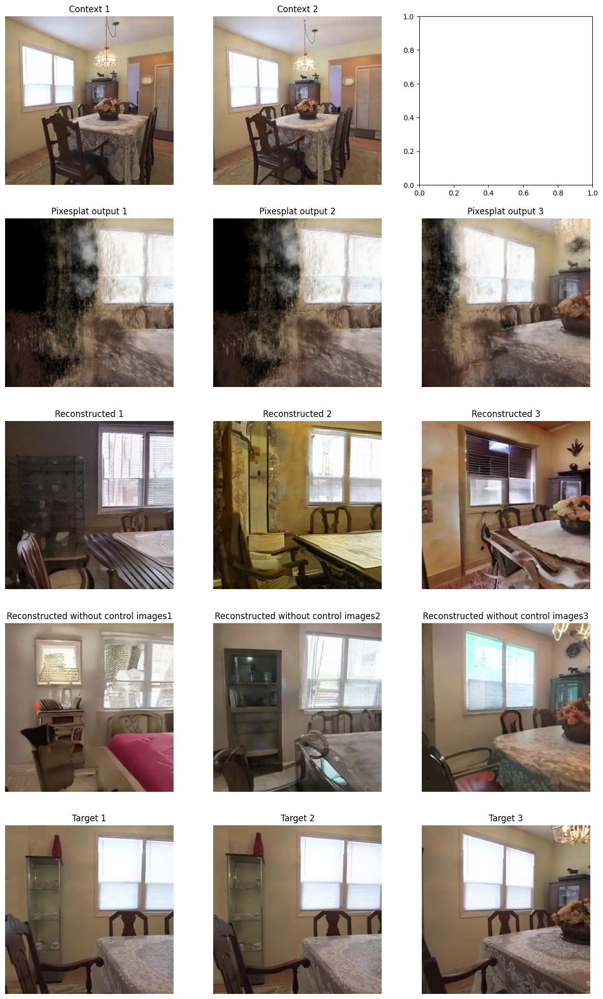

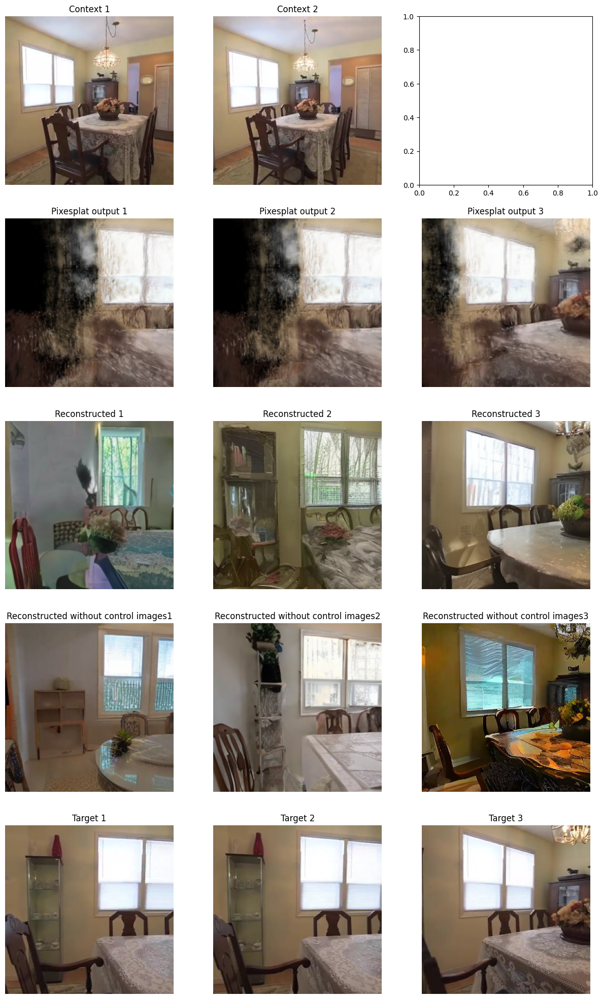

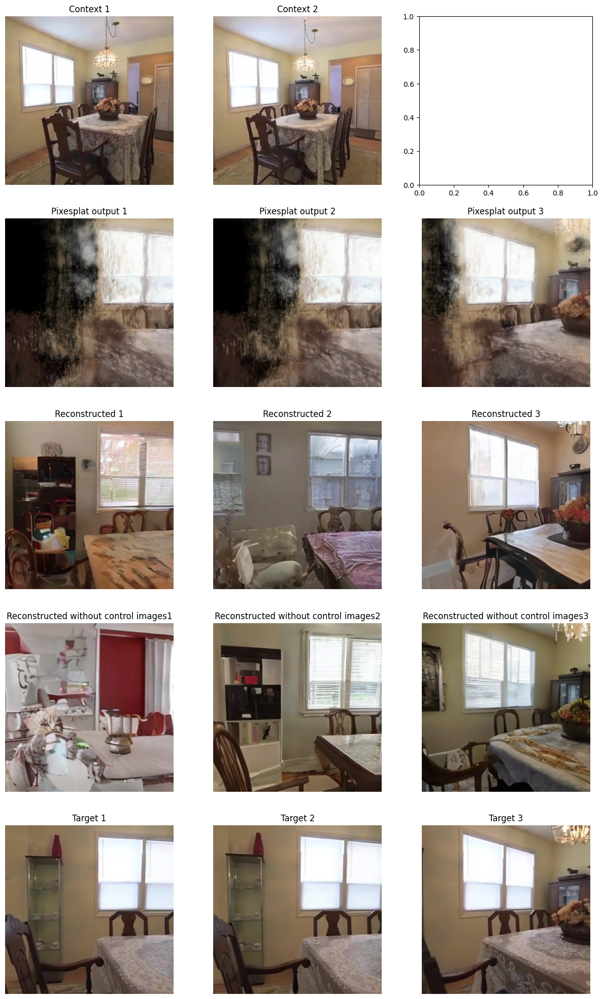

In [25]:
from pathlib import Path 
from tqdm.autonotebook import tqdm
import hashlib
from diffusers import AutoPipelineForInpainting, StableDiffusionInpaintPipeline
import torch
from PIL import Image
from pathlib import Path
import os
import numpy as np
import math
from diffusers.utils import load_image, make_image_grid
from tqdm.autonotebook import tqdm
import matplotlib.pyplot as plt
from matplotlib import interactive
%matplotlib inline
from skimage.metrics import structural_similarity


prompt = ""
# Device cpu or cuda give major difference, also make sure you are not overfitting to the seed
generator = torch.Generator(device="cuda")  #.manual_seed(33)

main_folder = "/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/"
for sample_folder in os.listdir(main_folder)[112:]:
    sample_path = os.path.join(main_folder, sample_folder)
    
    # Check if it's a directory
    if os.path.isdir(sample_path):
        
        context_folder = os.path.join(sample_path, "context")
        color_folder = os.path.join(sample_path, "color")
        target_folder = os.path.join(sample_path, "target")
       
        # Get the list of image files in each folder
        context_images = [os.path.join(context_folder, img) for img in os.listdir(context_folder) if img.endswith(".png")]
        color_images = [os.path.join(color_folder, img) for img in os.listdir(color_folder) if img.endswith(".png")]
        target_images = [os.path.join(target_folder, img) for img in os.listdir(target_folder) if img.endswith(".png")]
        
        
        # Display context images
        for _ in range(3):
            # Display images using matplotlib
            fig, axes = plt.subplots(5, 3, figsize=(15, 25))
            axes = axes.flatten()

            for i, img_path in enumerate(context_images):
                if i < 3:
                    context_image = Image.open(img_path)
                    axes[i].imshow(context_image)
                    axes[i].set_title(f"Context {i+1}")
                    axes[i].axis('off')
                    
            recons1 = list()
            recons2 = list()
            outs = list()

            # Display color images
            for i, img_path in enumerate(color_images):
                if i < 3:
                    color_image = Image.open(img_path)
                    axes[i+3].imshow(color_image)
                    axes[i+3].set_title(f"Pixesplat output {i+1}")
                    axes[i+3].axis('off')

                    outs.append(color_image)

                    # Reconstruct the image using pipe function
                    reconstructed_image = pipeline(prompt, color_image, control_image=[Image.open(img_path) for img_path in color_images][i], num_inference_steps=25, strength=0.1).images[0]
                    axes[i+6].imshow(reconstructed_image)
                    axes[i+6].set_title(f"Reconstructed {i+1}")
                    axes[i+6].axis('off')

                    recons1.append(reconstructed_image)

                    reconstructed_image = pipeline(prompt, color_image, num_inference_steps=25, strength=0.6).images[0]
                    axes[i+9].imshow(reconstructed_image)
                    axes[i+9].set_title(f"Reconstructed without control images{i+1}")
                    axes[i+9].axis('off')

                    recons2.append(reconstructed_image)
            
            # Display target images
            for i, img_path in enumerate(target_images):
                if i < 3:
                    target_image = Image.open(img_path)
                    axes[i+12].imshow(target_image)
                    axes[i+12].set_title(f"Target {i+1}")
                    axes[i+12].axis('off')      

                    (ssi, diff) = structural_similarity(np.array(outs[i]), np.array(target_image), full=True, channel_axis=-1)
                    print("pixelsplat SSI:", ssi)

                    (ssi, diff) = structural_similarity(np.array(recons1[i]), np.array(target_image), full=True, channel_axis=-1)
                    print("reconstructed w SSI:", ssi)

                    (ssi, diff) = structural_similarity(np.array(recons2[i]), np.array(target_image), full=True, channel_axis=-1)
                    print("reconstructed wo SSI:", ssi)

            fig.show()
        break
    break

In [10]:
from pathlib import Path 
from tqdm.autonotebook import tqdm
import hashlib
from diffusers import AutoPipelineForInpainting, StableDiffusionInpaintPipeline
import torch
from PIL import Image
from pathlib import Path
import os
import numpy as np
import math
from diffusers.utils import load_image, make_image_grid
from tqdm.autonotebook import tqdm
import matplotlib.pyplot as plt

# Device cpu or cuda give major difference, also make sure you are not overfitting to the seed
generator = torch.Generator(device="cuda").manual_seed(33)

main_folder = "/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/"
for sample_folder in os.listdir(main_folder):
    sample_path = os.path.join(main_folder, sample_folder)
    
    # Check if it's a directory
    if os.path.isdir(sample_path):

        context_folder = os.path.join(sample_path, "context")
        color_folder = os.path.join(sample_path, "color")
        target_folder = os.path.join(sample_path, "target")
       
        # Get the list of image files in each folder
        context_images = [os.path.join(context_folder, img) for img in os.listdir(context_folder) if img.endswith(".png")]
        color_images = [os.path.join(color_folder, img) for img in os.listdir(color_folder) if img.endswith(".png")]
        target_images = [os.path.join(target_folder, img) for img in os.listdir(target_folder) if img.endswith(".png")]
        
        print(len(context_images), len(color_images), len(target_images))
        
        # Display images using matplotlib
        fig, axes = plt.subplots(5, 3, figsize=(15, 25))
        axes = axes.flatten()

        # Display context images
        for i, img_path in enumerate(context_images):
            if i < 3:
                context_image = Image.open(img_path)
                axes[i].imshow(context_image)
                axes[i].set_title(f"Context {i+1}")
                axes[i].axis('off')
                
        # Display color images
        for i, img_path in enumerate(color_images):
            if i < 3:
                color_image = Image.open(img_path)
                axes[i+3].imshow(color_image)
                axes[i+3].set_title(f"Pixesplat output {i+1}")
                axes[i+3].axis('off')

                # Reconstruct the image using pipe function
                reconstructed_image = pipe(prompt, color_image, guidance_scale=0.0, strength=0.91, control_image=[Image.open(img_path) for img_path in color_images][i], generator=generator, num_inference_steps=30).images[0]
                axes[i+6].imshow(reconstructed_image)
                axes[i+6].set_title(f"Reconstructed {i+1}")
                axes[i+6].axis('off')

                reconstructed_image = pipe(prompt, color_image, guidance_scale=0.0, strength=0.9, generator=generator, num_inference_steps=30).images[0]
                axes[i+9].imshow(reconstructed_image)
                axes[i+9].set_title(f"Reconstructed without control images{i+1}")
                axes[i+9].axis('off')
        
        # Display target images
        for i, img_path in enumerate(target_images):
            if i < 3:
                target_image = Image.open(img_path)
                axes[i+12].imshow(target_image)
                axes[i+12].set_title(f"Target {i+1}")
                axes[i+12].axis('off')        

        plt.show()
        break
    break

RuntimeError: CUDA error: CUDA driver version is insufficient for CUDA runtime version
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Device-side assertions were explicitly omitted for this error check; the error probably arose while initializing the DSA handlers.

  0%|          | 0/27988 [00:00<?, ?it/s]

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000c3ab189999a83/context/000066.png
000066.png
/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000c3ab189999a83/color/000066.png


  0%|          | 0/70 [00:00<?, ?it/s]

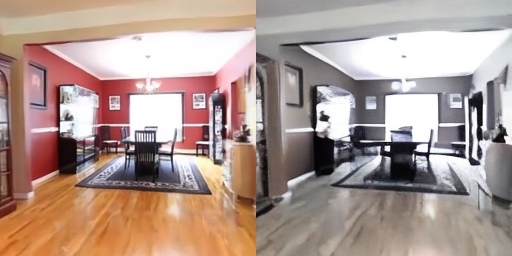

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000c3ab189999a83/context/000176.png
000176.png
/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000c3ab189999a83/color/000176.png


  0%|          | 0/70 [00:00<?, ?it/s]

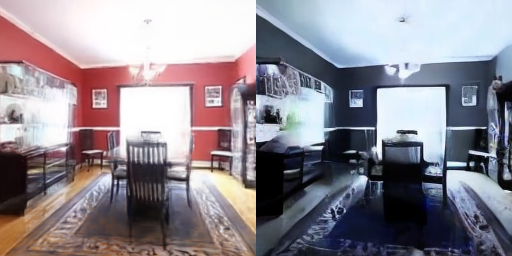

Stopping at 2 images


In [ ]:
# maybe this is wrong but cell below construct poor


from pathlib import Path 
from tqdm.autonotebook import tqdm
import hashlib
from diffusers import AutoPipelineForInpainting, StableDiffusionInpaintPipeline
import torch
from PIL import Image
from pathlib import Path
import numpy as np
import math
from diffusers.utils import load_image, make_image_grid
from tqdm.autonotebook import tqdm



pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.to("cpu")

# Device cpu or cuda give major difference
generator = torch.Generator(device="cpu").manual_seed(33)

prompt = "The same image but fixing small physical and illumination inconsistencies"
# prompt = ""

images_dir = Path("/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/")
diff_images_dir = images_dir.with_stem("re10k_test_context_images_diff")

diff_images_dir.mkdir(exist_ok=True)

max_images = 1
num_images = 0
for image_path in tqdm(list(images_dir.glob("*/color/*.png"))):
    context_image_path = image_path.parent.parent / "context" / image_path.name
    print(context_image_path)
    output_dir = diff_images_dir / f"{pipeline_name}"
    output_dir.mkdir(exist_ok=True)
    print(image_path.name)
    image_fn = Path(image_path.name)
    print(image_path)
    image = Image.open(image_path)
    
    # These are all parameters we can change
    diffused_image = pipe(prompt, image, control_image=image, generator=generator, strength=0.0, height=256, width=256,
        guidance_scale=0.0, num_inference_steps=70, controlnet_conditioning_scale=2.5).images[0]
    # diffused_image = pipe(prompt, image, control_image=image, generator=generator).images[0]
    
    # display(diffused_image)
    # diffused_image = diffused_image.resize((width, height)) # FIXME this shouldn't be necessary
    # diffused_image.save(output_dir / image_fn.with_stem(image_fn.stem + f"_diffused"))
    # display(diffused_image)

    grid_img = make_image_grid([image, diffused_image], rows=1, cols=2)
    # grid_img.save(output_dir / image_fn.with_stem(image_fn.stem + f"_grid"))
    display(grid_img)

    # not sure if this is really needed
    image.close()
    diffused_image.close()
    grid_img.close()

    num_images += 1

    if max_images and num_images > max_images:
        print(f"Stopping at {num_images} images")
        break
    if max_images and num_images > max_images:
        break


  0%|          | 0/27988 [00:00<?, ?it/s]

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000c3ab189999a83/target/000066.png


  0%|          | 0/15 [00:00<?, ?it/s]

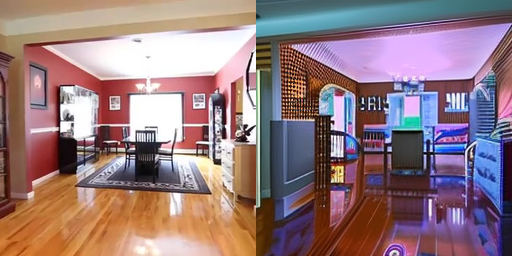

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000c3ab189999a83/target/000176.png


  0%|          | 0/15 [00:00<?, ?it/s]

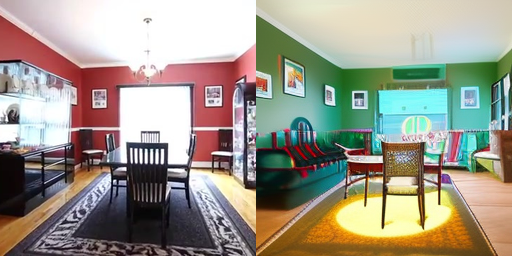

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000c3ab189999a83/target/000241.png


  0%|          | 0/15 [00:00<?, ?it/s]

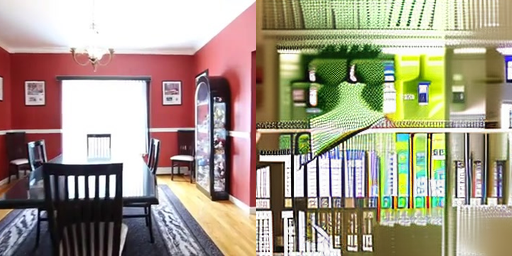

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000db54a47bd43fe/target/000126.png


  0%|          | 0/15 [00:00<?, ?it/s]

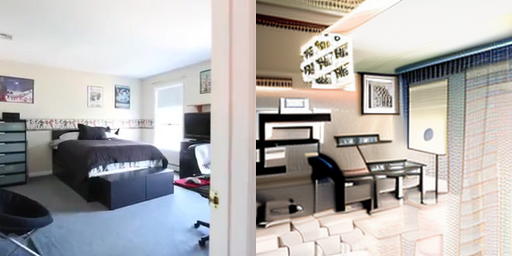

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000db54a47bd43fe/target/000142.png


  0%|          | 0/15 [00:00<?, ?it/s]

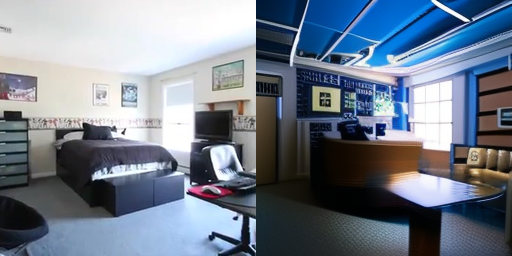

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000db54a47bd43fe/target/000166.png


  0%|          | 0/15 [00:00<?, ?it/s]

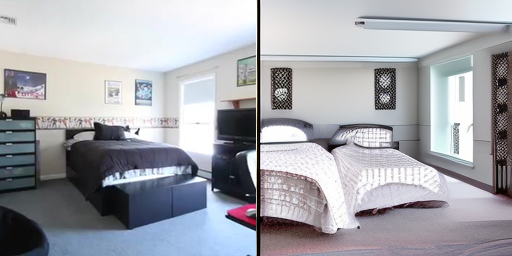

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/000db54a47bd43fe/target/000178.png


  0%|          | 0/15 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:

from pathlib import Path 
from tqdm.autonotebook import tqdm
import hashlib
from diffusers import AutoPipelineForInpainting, StableDiffusionInpaintPipeline
import torch
from PIL import Image
from pathlib import Path
import numpy as np
import math
from diffusers.utils import load_image, make_image_grid
from tqdm.autonotebook import tqdm

# prompt = "The same image but fixing small physical and illumination inconsistencies"
prompt = "The same image but fixing small physical and illumination inconsistencies"

images_dir = Path("/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/")
diff_images_dir = images_dir.with_stem("re10k_test_context_images_diff")

diff_images_dir.mkdir(exist_ok=True)

max_images = 20
num_images = 0
for image_path in tqdm(list(images_dir.glob("*/target/*.png"))):
    output_dir = diff_images_dir / f"{pipeline_name}"
    output_dir.mkdir(exist_ok=True)

    image_fn = Path(image_path.name)
    print(image_path)
    image = Image.open(image_path)
    # display(image)
    #image_array = np.asarray(image)
    #height, width, _ = image_array.shape
    # FIXME: little trick: do not pass the last character of the image name, so the two related images get the same mask
    
    diffused_image = pipe(
        prompt=prompt,
        image=image,
        width=256,
        height = 256, # height=height, # FIXME both width and height must be divisible by 8, but 180 isn't
        strength=1.0,
        guidance_scale=1.0,  # less emphasis on text prompt? just a guess
        controlnet_conditioning_scale=0.5,  # higher emphasis on the conditioning image? just a guess. setting it to higher than 1.0 produced garbage
        num_inference_steps=15
    ).images[0]
    # display(diffused_image)
    # diffused_image = diffused_image.resize((width, height)) # FIXME this shouldn't be necessary
    # diffused_image.save(output_dir / image_fn.with_stem(image_fn.stem + f"_diffused"))
    # display(diffused_image)

    grid_img = make_image_grid([image, diffused_image], rows=1, cols=2)
    # grid_img.save(output_dir / image_fn.with_stem(image_fn.stem + f"_grid"))
    display(grid_img)

    # not sure if this is really needed
    image.close()
    diffused_image.close()
    grid_img.close()

    num_images += 1

    if max_images and num_images > max_images:
        print(f"Stopping at {num_images} images")
        break
    if max_images and num_images > max_images:
        break

In [ ]:
 display(diffused_image)

Same code as before, but with changed params

In [8]:
# maybe this is wrong but cell below construct poor


from pathlib import Path 
from tqdm.autonotebook import tqdm
import hashlib
from diffusers import AutoPipelineForInpainting, StableDiffusionInpaintPipeline
import torch
from PIL import Image
from pathlib import Path
import numpy as np
import math
from diffusers.utils import load_image, make_image_grid
from tqdm.autonotebook import tqdm



pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe.to("cpu")

# Device cpu or cuda give major difference
generator = torch.Generator(device="cpu").manual_seed(0)

# prompt = "The same image but fixing small physical and illumination inconsistencies"
prompt = "Highly detailed and less illuminations"

images_dir = Path("/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_data/re10k/")
diff_images_dir = images_dir.with_stem("re10k_test_context_images_diff")

diff_images_dir.mkdir(exist_ok=True)

max_images = 1
num_images = 0
for image_path in tqdm(list(images_dir.glob("*/color/*.png"))):
    context_image_path = image_path.parent.parent / "context" / image_path.name
    print(context_image_path)
    output_dir = diff_images_dir / f"{pipeline_name}"
    output_dir.mkdir(exist_ok=True)
    print(image_path.name)
    image_fn = Path(image_path.name)
    print(image_path)
    image = Image.open(image_path)
    
    # These are all parameters we can change
    diffused_image = pipe(prompt=prompt, image=image, generator=generator, strength=0.0, height=256, width=256,
        guidance_scale=0.5, num_inference_steps=20, controlnet_conditioning_scale=2.5).images[0]
    # diffused_image = pipe(prompt, image, control_image=image, generator=generator).images[0]
    #     diffused_image = pipe(
    #     prompt=prompt,
    #     image=image,
    #     width=256,
    #     height = 256, # height=height, # FIXME both width and height must be divisible by 8, but 180 isn't
    #     strength=1.0,
    #     guidance_scale=1.0,  # less emphasis on text prompt? just a guess
    #     controlnet_conditioning_scale=0.5,  # higher emphasis on the conditioning image? just a guess. setting it to higher than 1.0 produced garbage
    #     num_inference_steps=15
    # ).images[0]
    
    # display(diffused_image)
    # diffused_image = diffused_image.resize((width, height)) # FIXME this shouldn't be necessary
    # diffused_image.save(output_dir / image_fn.with_stem(image_fn.stem + f"_diffused"))
    # display(diffused_image)

    grid_img = make_image_grid([image, diffused_image], rows=1, cols=2)
    # grid_img.save(output_dir / image_fn.with_stem(image_fn.stem + f"_grid"))
    display(grid_img)

    # not sure if this is really needed
    image.close()
    diffused_image.close()
    grid_img.close()

    num_images += 1

    if max_images and num_images > max_images:
        print(f"Stopping at {num_images} images")
        break
    if max_images and num_images > max_images:
        break


NameError: name 'pipe' is not defined

In [1]:
from pathlib import Path 
from tqdm.autonotebook import tqdm
import hashlib
from diffusers import AutoPipelineForInpainting, StableDiffusionInpaintPipeline
import torch
from PIL import Image
from pathlib import Path
import numpy as np
import math
from diffusers.utils import load_image, make_image_grid
from tqdm.autonotebook import tqdm

/tmp/ipykernel_3330/2394679680.py:2: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler

controlnet = ControlNetModel.from_pretrained("Wouter01/really_good_diffusion_model_out")
pipeline = StableDiffusionControlNetPipeline.from_pretrained(
	"stabilityai/stable-diffusion-2-1-base", controlnet=controlnet
)
pipeline_name = "sd21_small_test_image_controlnet"

pipe = pipeline

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [3]:
from pathlib import Path
import os
from tqdm import tqdm

path = Path("/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k")

rooms = []

for folder in path.iterdir():
    # print(folder)
    folder_path = folder / Path('instructir')
    if os.path.exists(folder_path):
        print(folder.stem)
        rooms.append(folder)

print(rooms)

1214f2a11a9fc1ed
20d86cff490c0c42
21e794f71e31becb
29e0bfbad00f0d5e
3087828bc27bc4c7
41abd737e0228c1a
5aca87f95a9412c6
6558c5f10d45a929
656381bea665bf3d
81be42df6ccae760
c48f19e2ffa52523
fea544b472e9abd1
[PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/1214f2a11a9fc1ed'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/20d86cff490c0c42'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/21e794f71e31becb'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/29e0bfbad00f0d5e'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/3087828bc27bc4c7'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/41abd737e0228c1a'), PosixPath('/teamspace/studi

In [5]:
rooms = rooms[3:]
print(rooms)

[PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/29e0bfbad00f0d5e'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/3087828bc27bc4c7'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/41abd737e0228c1a'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/5aca87f95a9412c6'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/6558c5f10d45a929'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/656381bea665bf3d'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/81be42df6ccae760'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/r

In [4]:
rooms = [Path('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/c48f19e2ffa52523')]
print(rooms)

ids = ['5aca87f95a9412c6', '20d86cff490c0c42', '41abd737e0228c1a', '1214f2a11a9fc1ed', '6558c5f10d45a929', '656381bea665bf3d', '3087828bc27bc4c7', 'c48f19e2ffa52523']
ids = ['20d86cff490c0c42', '41abd737e0228c1a', '1214f2a11a9fc1ed', '6558c5f10d45a929', '656381bea665bf3d', '3087828bc27bc4c7', 'c48f19e2ffa52523']

p = Path('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/')
rooms = [p / Path(id) for id in ids]
print(rooms)

# rooms = [Path('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/3087828bc27bc4c7')]
# print(rooms)

[PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/c48f19e2ffa52523')]
[PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/20d86cff490c0c42'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/41abd737e0228c1a'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/1214f2a11a9fc1ed'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/6558c5f10d45a929'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/656381bea665bf3d'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/3087828bc27bc4c7'), PosixPath('/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/

In [5]:
# prompt = "The same image but fixing small physical and illumination inconsistencies"
prompt = "The same image but fixing small physical and illumination inconsistencies"

generator = torch.Generator(device="cuda")
pipe.to("cuda")

for images_dir in rooms:

# images_dir = Path("/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/1214f2a11a9fc1ed/")
# diff_images_dir = images_dir.with_stem("re10k_test_context_images_diff")

# controlnet
        #   strength=1.0,
        #     guidance_scale=7.5,  # less emphasis on text prompt? just a guess
        #     controlnet_conditioning_scale=1.0,  # higher emphasis on the conditioning image? just a guess. setting it to higher than 1.0 produced garbage
        #     num_inference_steps=25

# controlnet2
        #   strength=1.0,
        #     guidance_scale=7.5,  # less emphasis on text prompt? just a guess
        #     controlnet_conditioning_scale=2.0,  # higher emphasis on the conditioning image? just a guess. setting it to higher than 1.0 produced garbage
        #     num_inference_steps=25

# controlnet3
        #   strength=1.0,
        #     guidance_scale=7.5,  # less emphasis on text prompt? just a guess
        #     controlnet_conditioning_scale=4.0,  # higher emphasis on the conditioning image? just a guess. setting it to higher than 1.0 produced garbage
        #     num_inference_steps=25


# diff_images_dir.mkdir(exist_ok=True)
    print(images_dir)

    max_images = 200
    num_images = 0
    for image_path in tqdm((images_dir / Path('color')).iterdir()):
        output_dir = images_dir / Path('controlnet2')
        output_dir.mkdir(exist_ok=True)
        # print(num_images)

        image_fn = Path(image_path.name)
        # print(image_path)
        image = Image.open(image_path)
        # display(image)
        image_array = np.asarray(image)
        #height, width, _ = image_array.shape
        # FIXME: little trick: do not pass the last character of the image name, so the two related images get the same mask
        
        diffused_image = pipe(
            prompt=prompt,
            image=image,
            generator=generator,
            width=256,
            height = 256, # height=height, # FIXME both width and height must be divisible by 8, but 180 isn't
            strength=1.0,
            guidance_scale=7.5,  # less emphasis on text prompt? just a guess
            controlnet_conditioning_scale=2.0,  # higher emphasis on the conditioning image? just a guess. setting it to higher than 1.0 produced garbage
            num_inference_steps=25
        ).images[0]
        # display(diffused_image)
        # diffused_image = diffused_image.resize((width, height)) # FIXME this shouldn't be necessary
        # diffused_image.save(output_dir / image_fn.with_stem(image_fn.stem + f"_diffused"))
        # display(diffused_image)

        # grid_img = make_image_grid([image, diffused_image], rows=1, cols=2)
        diffused_image.save(output_dir / image_fn.with_stem(image_fn.stem))
        # display(grid_img)

        # not sure if this is really needed
        image.close()
        diffused_image.close()
        # grid_img.close()

        num_images += 1

        if max_images and num_images > max_images:
            print(f"Stopping at {num_images} images")
            break
        if max_images and num_images > max_images:
            break #20d86cff490c0c42

/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/20d86cff490c0c42


0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1it [00:03,  3.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

2it [00:05,  2.66s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

3it [00:07,  2.47s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

4it [00:09,  2.38s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

5it [00:12,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

6it [00:14,  2.30s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

7it [00:16,  2.28s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

8it [00:18,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

9it [00:21,  2.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

10it [00:23,  2.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

11it [00:25,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

12it [00:27,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

13it [00:30,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

14it [00:32,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

15it [00:34,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

16it [00:36,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

17it [00:39,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

18it [00:41,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

19it [00:43,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

20it [00:45,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

21it [00:48,  2.25s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

22it [00:50,  2.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

23it [00:52,  2.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

24it [00:54,  2.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

25it [00:57,  2.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

26it [00:59,  2.26s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

27it [01:01,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

28it [01:04,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

29it [01:06,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

30it [01:08,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

31it [01:10,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

32it [01:13,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

33it [01:15,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

34it [01:17,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

35it [01:19,  2.27s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

36it [01:22,  2.28s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

37it [01:24,  2.28s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

38it [01:26,  2.28s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

39it [01:29,  2.28s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

40it [01:31,  2.28s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

41it [01:33,  2.28s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

42it [01:35,  2.28s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

43it [01:38,  2.29s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

44it [01:40,  2.29s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

45it [01:42,  2.29s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

46it [01:45,  2.29s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

47it [01:47,  2.29s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

48it [01:49,  2.29s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

49it [01:52,  2.29s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

50it [01:54,  2.29s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

51it [01:56,  2.30s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

52it [01:58,  2.30s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

53it [02:01,  2.30s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

54it [02:03,  2.30s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

55it [02:05,  2.30s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

56it [02:08,  2.31s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

57it [02:10,  2.31s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

58it [02:12,  2.31s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

59it [02:15,  2.31s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

60it [02:17,  2.31s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

61it [02:19,  2.31s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

62it [02:22,  2.31s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

63it [02:24,  2.31s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

64it [02:26,  2.31s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

65it [02:28,  2.32s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

66it [02:31,  2.32s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

67it [02:33,  2.32s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

68it [02:35,  2.32s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

69it [02:38,  2.32s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

70it [02:40,  2.32s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

71it [02:42,  2.32s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

72it [02:45,  2.32s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

73it [02:47,  2.32s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

74it [02:49,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

75it [02:52,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

76it [02:54,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

77it [02:56,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

78it [02:59,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

79it [03:01,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

80it [03:03,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

81it [03:06,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

82it [03:08,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

83it [03:10,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

84it [03:13,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

85it [03:15,  2.33s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

86it [03:17,  2.34s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

87it [03:20,  2.34s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

88it [03:22,  2.34s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

89it [03:24,  2.34s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

90it [03:27,  2.34s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

91it [03:29,  2.34s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

92it [03:31,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

93it [03:34,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

94it [03:36,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

95it [03:38,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

96it [03:41,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

97it [03:43,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

98it [03:46,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

99it [03:48,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100it [03:50,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

101it [03:53,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

102it [03:55,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

103it [03:57,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

104it [04:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

105it [04:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

106it [04:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

107it [04:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

108it [04:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

109it [04:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

110it [04:14,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

111it [04:16,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

112it [04:19,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

113it [04:21,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

114it [04:23,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

115it [04:26,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

116it [04:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

117it [04:30,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

118it [04:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

119it [04:35,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

120it [04:37,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

121it [04:40,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

122it [04:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

123it [04:45,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

124it [04:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

125it [04:49,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

126it [04:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

127it [04:54,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

128it [04:56,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

129it [04:59,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

130it [05:01,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

131it [05:03,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

132it [05:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

133it [05:08,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

134it [05:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

135it [05:13,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

136it [05:15,  2.32s/it]


/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/41abd737e0228c1a


0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1it [00:02,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

2it [00:04,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

3it [00:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

4it [00:09,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

5it [00:11,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

6it [00:14,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

7it [00:16,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

8it [00:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

9it [00:21,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

10it [00:23,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

11it [00:26,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

12it [00:28,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

13it [00:30,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

14it [00:33,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

15it [00:35,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

16it [00:37,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

17it [00:40,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

18it [00:42,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

19it [00:44,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

20it [00:47,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

21it [00:49,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

22it [00:52,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

23it [00:54,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

24it [00:56,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

25it [00:59,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

26it [01:01,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

27it [01:03,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

28it [01:06,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

29it [01:08,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

30it [01:11,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

31it [01:13,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

32it [01:15,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

33it [01:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

34it [01:20,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

35it [01:22,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

36it [01:25,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

37it [01:27,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

38it [01:30,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

39it [01:32,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

40it [01:34,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

41it [01:37,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

42it [01:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

43it [01:41,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

44it [01:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

45it [01:46,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

46it [01:48,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

47it [01:51,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

48it [01:53,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

49it [01:56,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

50it [01:58,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

51it [02:00,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

52it [02:03,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

53it [02:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

54it [02:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

55it [02:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

56it [02:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

57it [02:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

58it [02:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

59it [02:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

60it [02:22,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

61it [02:24,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

62it [02:26,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

63it [02:29,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

64it [02:31,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

65it [02:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

66it [02:36,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

67it [02:38,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

68it [02:40,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

69it [02:43,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

70it [02:45,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

71it [02:48,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

72it [02:50,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

73it [02:52,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

74it [02:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

75it [02:57,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

76it [02:59,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

77it [03:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

78it [03:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

79it [03:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

80it [03:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

81it [03:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

82it [03:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

83it [03:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

84it [03:18,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

85it [03:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

86it [03:23,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

87it [03:25,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

88it [03:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

89it [03:30,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

90it [03:32,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

91it [03:35,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

92it [03:37,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

93it [03:40,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

94it [03:42,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

95it [03:44,  2.38s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

96it [03:47,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

97it [03:49,  2.38s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

98it [03:51,  2.38s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

99it [03:54,  2.38s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100it [03:56,  2.38s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

101it [03:59,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

102it [04:01,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

103it [04:03,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

104it [04:06,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

105it [04:08,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

106it [04:10,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

107it [04:13,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

108it [04:15,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

109it [04:17,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

110it [04:20,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

111it [04:22,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

112it [04:25,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

113it [04:27,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

114it [04:29,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

115it [04:32,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

116it [04:34,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

117it [04:36,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

118it [04:39,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

119it [04:41,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

120it [04:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

121it [04:46,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

122it [04:48,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

123it [04:51,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

124it [04:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

125it [04:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

126it [04:58,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

127it [05:00,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

128it [05:02,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

129it [05:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

130it [05:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

131it [05:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

132it [05:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

133it [05:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

134it [05:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

135it [05:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

136it [05:21,  2.37s/it]


/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/1214f2a11a9fc1ed


0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1it [00:02,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

2it [00:04,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

3it [00:07,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

4it [00:09,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

5it [00:11,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

6it [00:14,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

7it [00:16,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

8it [00:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

9it [00:21,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

10it [00:23,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

11it [00:26,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

12it [00:28,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

13it [00:30,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

14it [00:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

15it [00:35,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

16it [00:37,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

17it [00:40,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

18it [00:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

19it [00:44,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

20it [00:47,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

21it [00:49,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

22it [00:51,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

23it [00:54,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

24it [00:56,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

25it [00:59,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

26it [01:01,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

27it [01:03,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

28it [01:06,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

29it [01:08,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

30it [01:10,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

31it [01:13,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

32it [01:15,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

33it [01:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

34it [01:20,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

35it [01:22,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

36it [01:24,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

37it [01:27,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

38it [01:29,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

39it [01:32,  2.38s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

40it [01:34,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

41it [01:36,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

42it [01:39,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

43it [01:41,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

44it [01:43,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

45it [01:46,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

46it [01:48,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

47it [01:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

48it [01:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

49it [01:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

50it [01:58,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

51it [02:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

52it [02:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

53it [02:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

54it [02:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

55it [02:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

56it [02:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

57it [02:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

58it [02:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

59it [02:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

60it [02:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

61it [02:24,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

62it [02:26,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

63it [02:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

64it [02:31,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

65it [02:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

66it [02:35,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

67it [02:38,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

68it [02:40,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

69it [02:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

70it [02:45,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

71it [02:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

72it [02:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

73it [02:52,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

74it [02:54,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

75it [02:57,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

76it [02:59,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

77it [03:01,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

78it [03:04,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

79it [03:06,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

80it [03:08,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

81it [03:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

82it [03:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

83it [03:16,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

84it [03:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

85it [03:20,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

86it [03:23,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

87it [03:25,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

88it [03:27,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

89it [03:30,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

90it [03:32,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

91it [03:34,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

92it [03:37,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

93it [03:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

94it [03:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

95it [03:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

96it [03:46,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

97it [03:49,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

98it [03:51,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

99it [03:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100it [03:56,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

101it [03:58,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

102it [04:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

103it [04:03,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

104it [04:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

105it [04:08,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

106it [04:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

107it [04:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

108it [04:15,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

109it [04:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

110it [04:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

111it [04:22,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

112it [04:24,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

113it [04:26,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

114it [04:29,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

115it [04:31,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

116it [04:34,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

117it [04:36,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

118it [04:38,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

119it [04:41,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

120it [04:43,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

121it [04:45,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

122it [04:48,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

123it [04:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

124it [04:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

125it [04:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

126it [04:57,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

127it [05:00,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

128it [05:02,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

129it [05:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

130it [05:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

131it [05:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

132it [05:11,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

133it [05:14,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

134it [05:16,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

135it [05:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

136it [05:21,  2.36s/it]


/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/6558c5f10d45a929


0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1it [00:02,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

2it [00:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

3it [00:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

4it [00:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

5it [00:11,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

6it [00:14,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

7it [00:16,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

8it [00:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

9it [00:21,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

10it [00:23,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

11it [00:26,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

12it [00:28,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

13it [00:30,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

14it [00:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

15it [00:35,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

16it [00:37,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

17it [00:40,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

18it [00:42,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

19it [00:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

20it [00:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

21it [00:49,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

22it [00:52,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

23it [00:54,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

24it [00:56,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

25it [00:59,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

26it [01:01,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

27it [01:03,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

28it [01:06,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

29it [01:08,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

30it [01:10,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

31it [01:13,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

32it [01:15,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

33it [01:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

34it [01:20,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

35it [01:22,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

36it [01:25,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

37it [01:27,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

38it [01:29,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

39it [01:32,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

40it [01:34,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

41it [01:37,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

42it [01:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

43it [01:41,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

44it [01:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

45it [01:46,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

46it [01:48,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

47it [01:51,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

48it [01:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

49it [01:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

50it [01:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

51it [02:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

52it [02:03,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

53it [02:05,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

54it [02:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

55it [02:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

56it [02:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

57it [02:14,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

58it [02:17,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

59it [02:19,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

60it [02:21,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

61it [02:24,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

62it [02:26,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

63it [02:29,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

64it [02:31,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

65it [02:33,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

66it [02:36,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

67it [02:38,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

68it [02:40,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

69it [02:43,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

70it [02:45,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

71it [02:47,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

72it [02:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

73it [02:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

74it [02:55,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

75it [02:57,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

76it [02:59,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

77it [03:02,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

78it [03:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

79it [03:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

80it [03:09,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

81it [03:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

82it [03:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

83it [03:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

84it [03:18,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

85it [03:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

86it [03:23,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

87it [03:25,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

88it [03:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

89it [03:30,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

90it [03:32,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

91it [03:35,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

92it [03:37,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

93it [03:40,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

94it [03:42,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

95it [03:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

96it [03:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

97it [03:49,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

98it [03:51,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

99it [03:54,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100it [03:56,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

101it [03:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

102it [04:01,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

103it [04:03,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

104it [04:06,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

105it [04:08,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

106it [04:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

107it [04:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

108it [04:15,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

109it [04:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

110it [04:20,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

111it [04:22,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

112it [04:24,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

113it [04:27,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

114it [04:29,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

115it [04:32,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

116it [04:34,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

117it [04:36,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

118it [04:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

119it [04:41,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

120it [04:43,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

121it [04:46,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

122it [04:48,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

123it [04:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

124it [04:53,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

125it [04:55,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

126it [04:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

127it [05:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

128it [05:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

129it [05:05,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

130it [05:07,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

131it [05:09,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

132it [05:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

133it [05:14,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

134it [05:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

135it [05:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

136it [05:21,  2.37s/it]


/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/656381bea665bf3d


0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1it [00:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

2it [00:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

3it [00:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

4it [00:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

5it [00:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

6it [00:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

7it [00:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

8it [00:18,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

9it [00:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

10it [00:23,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

11it [00:25,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

12it [00:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

13it [00:30,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

14it [00:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

15it [00:35,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

16it [00:37,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

17it [00:40,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

18it [00:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

19it [00:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

20it [00:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

21it [00:49,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

22it [00:51,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

23it [00:54,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

24it [00:56,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

25it [00:59,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

26it [01:01,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

27it [01:03,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

28it [01:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

29it [01:08,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

30it [01:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

31it [01:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

32it [01:15,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

33it [01:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

34it [01:20,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

35it [01:22,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

36it [01:25,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

37it [01:27,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

38it [01:29,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

39it [01:32,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

40it [01:34,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

41it [01:36,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

42it [01:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

43it [01:41,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

44it [01:43,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

45it [01:46,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

46it [01:48,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

47it [01:51,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

48it [01:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

49it [01:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

50it [01:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

51it [02:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

52it [02:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

53it [02:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

54it [02:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

55it [02:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

56it [02:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

57it [02:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

58it [02:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

59it [02:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

60it [02:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

61it [02:24,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

62it [02:26,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

63it [02:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

64it [02:31,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

65it [02:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

66it [02:35,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

67it [02:38,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

68it [02:40,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

69it [02:43,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

70it [02:45,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

71it [02:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

72it [02:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

73it [02:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

74it [02:54,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

75it [02:57,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

76it [02:59,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

77it [03:01,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

78it [03:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

79it [03:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

80it [03:08,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

81it [03:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

82it [03:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

83it [03:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

84it [03:18,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

85it [03:20,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

86it [03:23,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

87it [03:25,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

88it [03:27,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

89it [03:30,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

90it [03:32,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

91it [03:34,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

92it [03:37,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

93it [03:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

94it [03:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

95it [03:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

96it [03:46,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

97it [03:49,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

98it [03:51,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

99it [03:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100it [03:56,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

101it [03:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

102it [04:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

103it [04:03,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

104it [04:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

105it [04:08,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

106it [04:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

107it [04:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

108it [04:15,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

109it [04:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

110it [04:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

111it [04:22,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

112it [04:24,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

113it [04:26,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

114it [04:29,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

115it [04:31,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

116it [04:34,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

117it [04:36,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

118it [04:38,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

119it [04:41,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

120it [04:43,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

121it [04:45,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

122it [04:48,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

123it [04:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

124it [04:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

125it [04:55,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

126it [04:57,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

127it [05:00,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

128it [05:02,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

129it [05:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

130it [05:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

131it [05:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

132it [05:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

133it [05:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

134it [05:16,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

135it [05:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

136it [05:21,  2.36s/it]


/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/3087828bc27bc4c7


0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1it [00:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

2it [00:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

3it [00:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

4it [00:09,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

5it [00:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

6it [00:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

7it [00:16,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

8it [00:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

9it [00:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

10it [00:23,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

11it [00:26,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

12it [00:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

13it [00:30,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

14it [00:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

15it [00:35,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

16it [00:37,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

17it [00:40,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

18it [00:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

19it [00:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

20it [00:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

21it [00:49,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

22it [00:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

23it [00:54,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

24it [00:56,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

25it [00:59,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

26it [01:01,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

27it [01:03,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

28it [01:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

29it [01:08,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

30it [01:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

31it [01:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

32it [01:15,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

33it [01:18,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

34it [01:20,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

35it [01:22,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

36it [01:25,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

37it [01:27,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

38it [01:29,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

39it [01:32,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

40it [01:34,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

41it [01:36,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

42it [01:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

43it [01:41,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

44it [01:44,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

45it [01:46,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

46it [01:48,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

47it [01:51,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

48it [01:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

49it [01:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

50it [01:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

51it [02:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

52it [02:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

53it [02:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

54it [02:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

55it [02:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

56it [02:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

57it [02:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

58it [02:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

59it [02:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

60it [02:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

61it [02:24,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

62it [02:26,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

63it [02:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

64it [02:31,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

65it [02:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

66it [02:35,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

67it [02:38,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

68it [02:40,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

69it [02:43,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

70it [02:45,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

71it [02:47,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

72it [02:50,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

73it [02:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

74it [02:54,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

75it [02:57,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

76it [02:59,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

77it [03:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

78it [03:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

79it [03:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

80it [03:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

81it [03:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

82it [03:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

83it [03:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

84it [03:18,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

85it [03:20,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

86it [03:23,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

87it [03:25,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

88it [03:28,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

89it [03:30,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

90it [03:32,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

91it [03:35,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

92it [03:37,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

93it [03:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

94it [03:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

95it [03:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

96it [03:46,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

97it [03:49,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

98it [03:51,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

99it [03:54,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100it [03:56,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

101it [03:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

102it [04:01,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

103it [04:03,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

104it [04:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

105it [04:08,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

106it [04:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

107it [04:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

108it [04:15,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

109it [04:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

110it [04:20,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

111it [04:22,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

112it [04:24,  2.42s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

113it [04:27,  2.40s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

114it [04:29,  2.39s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

115it [04:32,  2.38s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

116it [04:34,  2.38s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

117it [04:36,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

118it [04:39,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

119it [04:41,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

120it [04:43,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

121it [04:46,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

122it [04:48,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

123it [04:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

124it [04:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

125it [04:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

126it [04:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

127it [05:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

128it [05:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

129it [05:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

130it [05:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

131it [05:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

132it [05:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

133it [05:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

134it [05:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

135it [05:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

136it [05:21,  2.37s/it]


/teamspace/studios/this_studio/diffusion-augmented-pixelsplat/outputs/re10k_test_hard_more/re10k/c48f19e2ffa52523


0it [00:00, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1it [00:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

2it [00:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

3it [00:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

4it [00:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

5it [00:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

6it [00:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

7it [00:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

8it [00:18,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

9it [00:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

10it [00:23,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

11it [00:26,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

12it [00:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

13it [00:30,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

14it [00:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

15it [00:35,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

16it [00:37,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

17it [00:40,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

18it [00:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

19it [00:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

20it [00:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

21it [00:49,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

22it [00:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

23it [00:54,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

24it [00:56,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

25it [00:59,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

26it [01:01,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

27it [01:03,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

28it [01:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

29it [01:08,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

30it [01:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

31it [01:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

32it [01:15,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

33it [01:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

34it [01:20,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

35it [01:22,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

36it [01:25,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

37it [01:27,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

38it [01:29,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

39it [01:32,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

40it [01:34,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

41it [01:36,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

42it [01:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

43it [01:41,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

44it [01:43,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

45it [01:46,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

46it [01:48,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

47it [01:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

48it [01:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

49it [01:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

50it [01:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

51it [02:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

52it [02:02,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

53it [02:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

54it [02:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

55it [02:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

56it [02:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

57it [02:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

58it [02:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

59it [02:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

60it [02:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

61it [02:23,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

62it [02:26,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

63it [02:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

64it [02:31,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

65it [02:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

66it [02:35,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

67it [02:38,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

68it [02:40,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

69it [02:42,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

70it [02:45,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

71it [02:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

72it [02:49,  2.35s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

73it [02:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

74it [02:54,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

75it [02:56,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

76it [02:59,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

77it [03:01,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

78it [03:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

79it [03:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

80it [03:08,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

81it [03:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

82it [03:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

83it [03:15,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

84it [03:18,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

85it [03:20,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

86it [03:22,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

87it [03:25,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

88it [03:27,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

89it [03:29,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

90it [03:32,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

91it [03:34,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

92it [03:37,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

93it [03:39,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

94it [03:41,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

95it [03:44,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

96it [03:46,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

97it [03:48,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

98it [03:51,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

99it [03:53,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

100it [03:55,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

101it [03:58,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

102it [04:00,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

103it [04:03,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

104it [04:05,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

105it [04:07,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

106it [04:10,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

107it [04:12,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

108it [04:14,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

109it [04:17,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

110it [04:19,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

111it [04:21,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

112it [04:24,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

113it [04:26,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

114it [04:28,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

115it [04:31,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

116it [04:33,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

117it [04:36,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

118it [04:38,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

119it [04:40,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

120it [04:43,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

121it [04:45,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

122it [04:47,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

123it [04:50,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

124it [04:52,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

125it [04:54,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

126it [04:57,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

127it [04:59,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

128it [05:02,  2.37s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

129it [05:04,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

130it [05:06,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

131it [05:09,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

132it [05:11,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

133it [05:13,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

134it [05:16,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

135it [05:18,  2.36s/it]

  0%|          | 0/25 [00:00<?, ?it/s]

136it [05:20,  2.36s/it]
